In [15]:
import os
import sys
import random
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2

import tensorflow as tf
from keras.models import Model, load_model
from keras.layers import Input
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K

from tqdm.notebook import tqdm
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

In [2]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3
TRAIN_PATH = 'dataset/stage1_train/'
TEST_PATH = 'dataset/stage1_test/'

warnings.filterwarnings('ignore', category=UserWarning, module='skimage')
seed = 42
random.seed = seed
np.random.seed = seed

In [3]:
try:
    train_ids = next(os.walk(TRAIN_PATH))[1]
    test_ids = next(os.walk(TEST_PATH))[1]
except Exception as e:
    print("Error in getting training and testing filenames")
    print(e)
print(train_ids[:3])

['5cc036b65f7f2d5480e2be111a561f3713ac021683a9a9138dc49492a29ce856', '68f833de9f8c631cedd7031b8ed9b908c42cbbc1e14254722728a8b7d596fd4c', '6c67b78e8164801059375ed9a607f61e67a7ae347e92e36a7f20514224541d56']


In [4]:
# uncomment above lines only if resizing has not already been done - TAKES TIME !!

# X_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
# for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):
#             path = TRAIN_PATH + id_
#             img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNELS]
#             img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
#             X_train[n] = img

# np.save('resizedXTrain256',X_train)

X_train = np.load('resizedXTrain256.npy')

print("Shape of X_train: "+str(X_train.shape))

Shape of X_train: (670, 256, 256, 3)


In [5]:
TRAIN_PATH = 'dataset/stage1_train/'
all_masks_paths = []

for i in range(len(train_ids)):
    path = TRAIN_PATH + train_ids[i]+'/new_masks/'
    indi_masks_paths=[]
    for j in next(os.walk(path))[2]:
        indi_masks_paths.append(path+j)
        
    all_masks_paths.append(indi_masks_paths)

## Without resizing

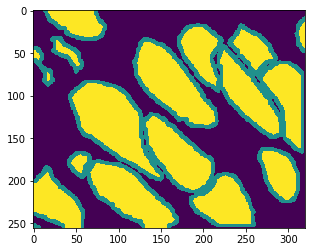

In [6]:
p = 'dataset/stage1_train/13f2bec0a24c70345372febb14c4352877b1b6c1b01896246048e83c345c0914/masks/'
#p = 'dataset/stage1_train/6c67b78e8164801059375ed9a607f61e67a7ae347e92e36a7f20514224541d56/new_masks/'
p_ids = next(os.walk(p))[2]

p_ids_paths = []
for i in p_ids:
    p_ids_paths.append(p+i)
    
mask_paths = p_ids_paths # list of mask file (contain in masks folder, one per cell)

first_mask = cv2.imread(mask_paths[0], 0)
full_mask = np.zeros_like(first_mask).astype('float64')
#full_mask = np.zeros((IMG_HEIGHT, IMG_WIDTH)).astype('float64')

kernel = np.ones((5,5),np.uint8)  # Kernel for the erosion -> you can control the border size with that

for path in mask_paths:
    mask = cv2.imread(path, 0) 
    #print(mask.shape)
#    mask = resize(mask, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    mask = mask/ 255    
    erosion = cv2.erode(mask, kernel, iterations=2) # Iterations can also help controlling the border size.
    border_mask = mask + erosion
    full_mask += border_mask
plt.imshow(full_mask)

In [7]:
full_mask.shape

(256, 320)

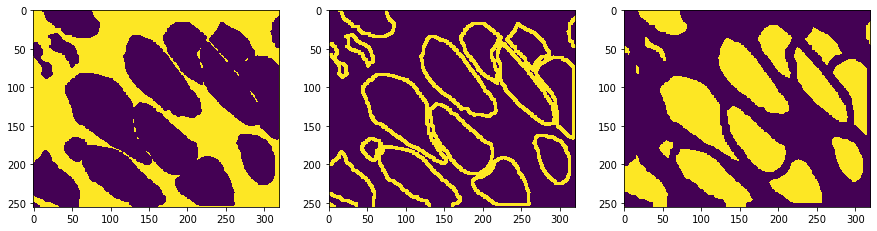

In [8]:
one_hot_mask = np.zeros((full_mask.shape[0], full_mask.shape[1], 3))  # 3 = nb of classes


np.put_along_axis(
    one_hot_mask,
    indices=full_mask[..., np.newaxis].astype(np.int32),
    values=full_mask[..., np.newaxis] > -1,
    axis=-1,
)

fig, ax = plt.subplots(figsize=(15,5))

# background
plt.subplot(1,3,1)
plt.imshow(one_hot_mask[...,0])

# borders
plt.subplot(1,3,2)
plt.imshow(one_hot_mask[...,1])

# cells
plt.subplot(1,3,3)
plt.imshow(one_hot_mask[...,2])

## With Resizing

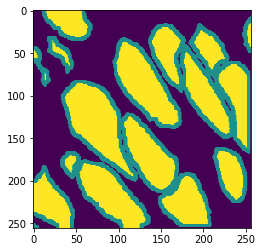

In [9]:
p = 'dataset/stage1_train/13f2bec0a24c70345372febb14c4352877b1b6c1b01896246048e83c345c0914/masks/'
#p = 'dataset/stage1_train/6c67b78e8164801059375ed9a607f61e67a7ae347e92e36a7f20514224541d56/new_masks/'
p_ids = next(os.walk(p))[2]

p_ids_paths = []
for i in p_ids:
    p_ids_paths.append(p+i)
    
mask_paths = p_ids_paths # list of mask file (contain in masks folder, one per cell)

IMG_HEIGHT = 256
IMG_WIDTH = 256
# first_mask = cv2.imread(mask_paths[0], 0)
# full_mask = np.zeros_like(first_mask).astype('float64')
full_mask = np.zeros((IMG_HEIGHT, IMG_WIDTH)).astype('float64')

# kernel = np.ones((5,5),np.uint8)  # Kernel for the erosion -> you can control the border size with that

for path in mask_paths:
    mask = cv2.imread(path, 0) 
    #print(mask.shape)
    mask = resize(mask, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    mask = mask/ 255    
    erosion = cv2.erode(mask, kernel, iterations=2) # Iterations can also help controlling the border size.
    border_mask = mask + erosion
    full_mask += border_mask
plt.imshow(full_mask)

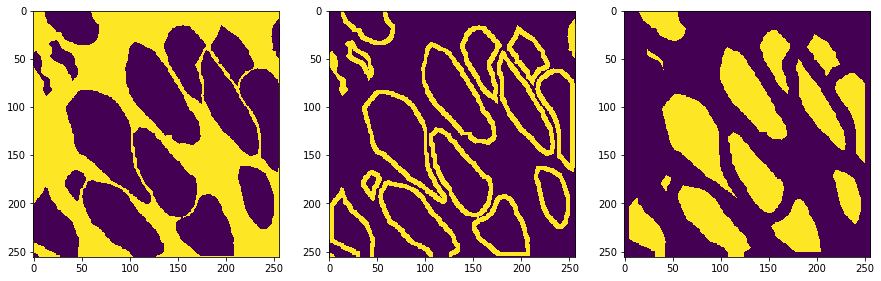

In [10]:
one_hot_mask = np.zeros((full_mask.shape[0], full_mask.shape[1], 3))  # 3 = nb of classes


np.put_along_axis(
    one_hot_mask,
    indices=full_mask[..., np.newaxis].astype(np.int32),
    values=full_mask[..., np.newaxis] > -1,
    axis=-1,
)

fig, ax = plt.subplots(figsize=(15,5))

# background
plt.subplot(1,3,1)
plt.imshow(one_hot_mask[...,0])

# borders
plt.subplot(1,3,2)
plt.imshow(one_hot_mask[...,1])

# cells
plt.subplot(1,3,3)
plt.imshow(one_hot_mask[...,2])

## Build the pipeline for all the images (reading raw to converting them to 3 classes)

In [11]:
TRAIN_PATH = 'dataset/stage1_train/'
all_masks_paths = []

for i in range(len(train_ids)):
    path = TRAIN_PATH + train_ids[i]+'/masks/'
    indi_masks_paths=[]
    for j in next(os.walk(path))[2]:
        indi_masks_paths.append(path+j)
        
    all_masks_paths.append(indi_masks_paths)

In [12]:
all_full_masks = []

IMG_HEIGHT = 256
IMG_WIDTH = 256

count = 1
for each_img_mask in tqdm(all_masks_paths):

    mask_paths = each_img_mask # list of mask file (contain in masks folder, one per cell)

    #first_mask = cv2.imread(all_masks_paths[2][1], 0)
    #full_mask = np.zeros_like(first_mask).astype('float64')
    full_mask = np.zeros((IMG_HEIGHT, IMG_WIDTH)).astype('float64')
    
    kernel = np.ones((5,5),np.uint8)  # Kernel for the erosion -> you can control the border size with that

    for path in mask_paths:
        mask = cv2.imread(path, 0) 
        #print(mask.shape)
        mask = resize(mask, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
        mask = mask/ 255    
        erosion = cv2.erode(mask, kernel, iterations=2) # Iterations can also help controlling the border size.
        border_mask = mask + erosion
        full_mask += border_mask
        
    #all_full_masks = np.append(all_full_masks,full_mask,axis=0)
    all_full_masks.append(full_mask)
    #all_full_masks = np.vstack((all_full_masks,np.array([full_mask])))

#all_full_masks.shape
#len(all_full_masks)
all_full_masks =np.array(all_full_masks)

print(all_full_masks.shape)


(670, 256, 256)


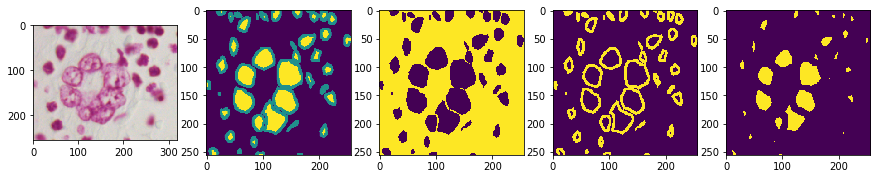

In [13]:
ex = 530 #460
original_path = TRAIN_PATH + train_ids[ex]+'/images/'+train_ids[ex]+'.png'

one_hot_mask = np.zeros((all_full_masks[ex].shape[0], all_full_masks[ex].shape[1], 3))  # 3 = nb of classes

np.put_along_axis(
    one_hot_mask,
    indices=all_full_masks[ex][..., np.newaxis].astype(np.int32),
    values=all_full_masks[ex][..., np.newaxis] > -1,
    axis=-1,
)

fig, ax = plt.subplots(figsize=(15,5))

# original image
plt.subplot(1,5,1)
plt.imshow(cv2.imread(original_path))

# with all 3 classes
plt.subplot(1,5,2)
plt.imshow(all_full_masks[ex])

# background
plt.subplot(1,5,3)
plt.imshow(one_hot_mask[...,0])

# borders
plt.subplot(1,5,4)
plt.imshow(one_hot_mask[...,1])

# cells
plt.subplot(1,5,5)
plt.imshow(one_hot_mask[...,2])

In [17]:
all_one_hot_mask = list()
for i in tqdm(range(all_full_masks.shape[0])):
    one_hot_mask = np.zeros((all_full_masks[i].shape[0], all_full_masks[i].shape[1], 3))  # 3 = nb of classes

    np.put_along_axis(
        one_hot_mask,
        indices=all_full_masks[i][..., np.newaxis].astype(np.int32),
        values=all_full_masks[i][..., np.newaxis] > -1,
        axis=-1,
    )
    
    all_one_hot_mask.append(one_hot_mask)

all_one_hot_mask = np.array(all_one_hot_mask)

Y_train = all_one_hot_mask
print("Shape of Y_train: "+str(Y_train.shape))


Shape of Y_train: (670, 256, 256, 3)


#### Visualize A Sample Image

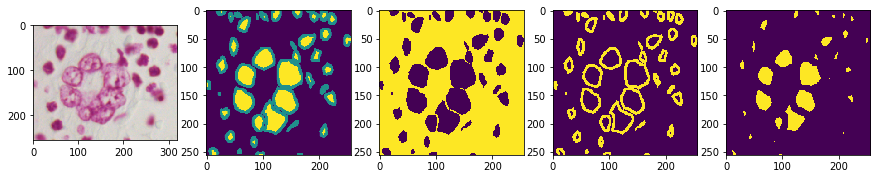

In [15]:
ex = 530
original_path = TRAIN_PATH + train_ids[ex]+'/images/'+train_ids[ex]+'.png'

fig, ax = plt.subplots(figsize=(15,5))

# original image
plt.subplot(1,5,1)
plt.imshow(cv2.imread(original_path))

# with all 3 classes
plt.subplot(1,5,2)
plt.imshow(all_full_masks[ex])

# background
plt.subplot(1,5,3)
plt.imshow(all_one_hot_mask[ex][...,0])

# borders
plt.subplot(1,5,4)
plt.imshow(all_one_hot_mask[ex][...,1])

# cells
plt.subplot(1,5,5)
plt.imshow(all_one_hot_mask[ex][...,2])

## Build Model

In [141]:
# Define IoU metric
def mean_iou(y_true, y_pred):
    prec = []
    for t in np.arange(0.5, 1.0, 0.05):
        y_pred_ = tf.cast(y_pred > t,tf.int32)
        score, up_opt = tf.compat.v1.metrics.mean_iou(y_true, y_pred_, 3) # here 3 refers to the number of classes
        K.get_session().run(tf.local_variables_initializer())
        with tf.control_dependencies([up_opt]):
            score = tf.identity(score)
        prec.append(score)
    return K.mean(K.stack(prec), axis=0)

In [142]:
# Build U-Net model; we use keras to define the NN layers. It's very easy to do with K

inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
s = Lambda(lambda x: x / 255) (inputs)

c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p2)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (p4)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (c9)

# why don't we flatten the last few layers? and then make them full connected?

outputs = Conv2D(3, (1, 1), activation='softmax') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[mean_iou])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 256, 256, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 448         lambda_1[0][0]                   
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 256, 256, 16) 0           conv2d_1[0][0]                   
____________________________________________________________________________________________

In [18]:
earlystopper = EarlyStopping(patience=5, verbose=1)
checkpointer = ModelCheckpoint('model-unet-v2.h5', verbose=1, save_best_only=True) #v2 for 50 epochs #v1 for 10 epochs
results = model.fit(X_train, Y_train, validation_split=0.1, batch_size=16, epochs=50, 
                    callbacks=[earlystopper, checkpointer])


Train on 603 samples, validate on 67 samples
Epoch 1/50
603/603 [==============================] - 157s 260ms/step - loss: 0.5628 - mean_iou: 0.5022 - val_loss: 0.2615 - val_mean_iou: 0.6597

Epoch 00001: val_loss improved from inf to 0.26146, saving model to model-unet-v2.h5
Epoch 2/50
603/603 [==============================] - 146s 242ms/step - loss: 0.2368 - mean_iou: 0.7152 - val_loss: 0.1987 - val_mean_iou: 0.7528

Epoch 00002: val_loss improved from 0.26146 to 0.19867, saving model to model-unet-v2.h5
Epoch 3/50
603/603 [==============================] - 146s 242ms/step - loss: 0.1899 - mean_iou: 0.7747 - val_loss: 0.1880 - val_mean_iou: 0.7927

Epoch 00003: val_loss improved from 0.19867 to 0.18801, saving model to model-unet-v2.h5
Epoch 4/50
603/603 [==============================] - 146s 242ms/step - loss: 0.1729 - mean_iou: 0.8039 - val_loss: 0.2035 - val_mean_iou: 0.8140

Epoch 00004: val_loss did not improve from 0.18801
Epoch 5/50
603/603 [==============================] 

## Model Summary

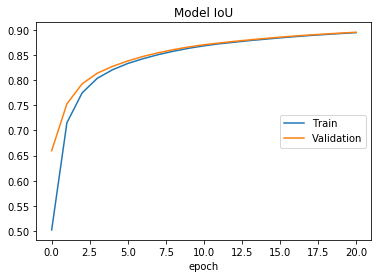

In [116]:
# summarize history for accuracy
plt.plot(results.history['mean_iou'])
plt.plot(results.history['val_mean_iou'])
plt.title('Model IoU')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='center right')
plt.show()

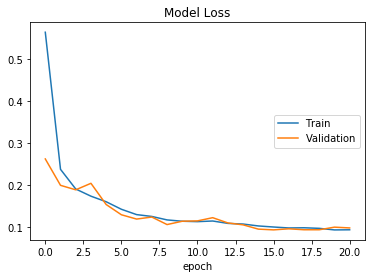

In [117]:
# summarize history for loss
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='center right')
plt.show()


## Predict On Validation Data
#### Load The Model Built On Complete Training Data. 

In [18]:
def predictCVData(X_train, Y_train, model):
    X_val_data = X_train[600:]
    preds_val = model.predict(X_val_data, verbose=1)
    return preds_val

model = load_model('model-unet-v2.h5', custom_objects={'mean_iou': mean_iou})

preds_val_t = predictCVData(X_train, Y_train, model)

70/70 [==============================] - 8s 112ms/step


#### Visualize Original Images, Original Masks And Predicted Masks Of Validation Data

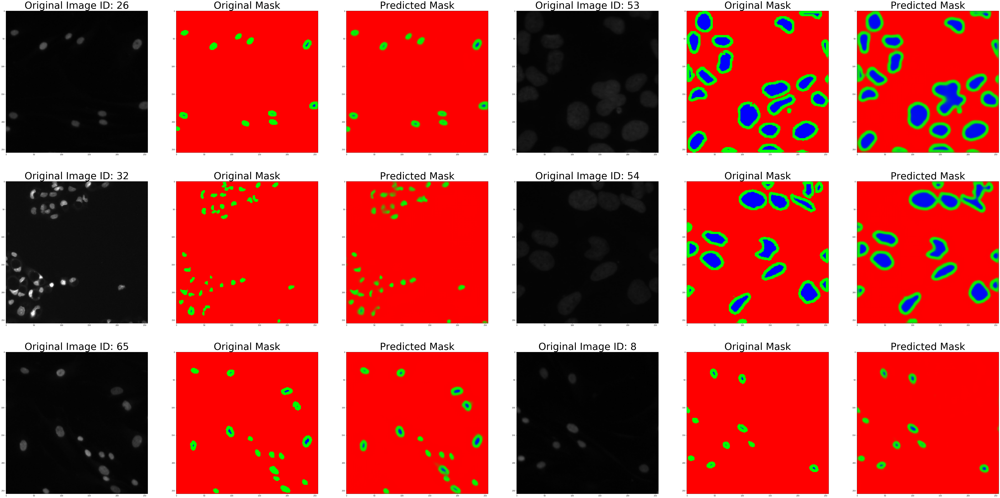

In [100]:
fig = plt.figure(figsize=(100,50))
nSamples = 6
nrows = 3
ncols = 6
X_val_data = X_train[600:]
Y_val_data = Y_train[600:]
ids = np.random.choice(range(X_val_data.shape[0]), nSamples, replace=False)
counter = 1

for i in ids: 
    #training image
    plt.subplot(nrows, ncols, counter)
    plt.imshow(X_val_data[i])
    plt.title('Original Image ' + 'ID: '+str(i), fontsize=55)
    counter += 1
    
    #original mask
    plt.subplot(nrows, ncols, counter)
    plt.imshow(Y_val_data[i])
    plt.title('Original Mask', fontsize=55)
    counter += 1
    
    #predicted mask
    plt.subplot(nrows, ncols, counter)
    plt.imshow(preds_val_t[i])
    plt.title('Predicted Mask', fontsize=55)
    counter += 1

63


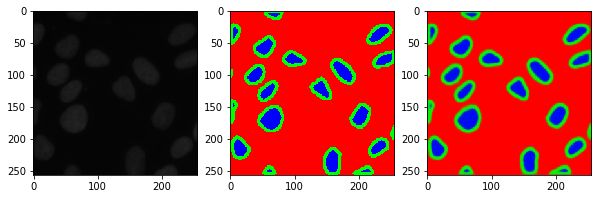

In [101]:
fig = plt.figure(figsize=(10,5))
#ix = random.randint(0, len(preds_val_t)) #60, 56, 53, 54, 8
ix = 63
print(ix)

# shows the training image
plt.subplot(1, 3, 1)
plt.imshow(X_val_data[ix])

# shows the label mask of original image
plt.subplot(1, 3, 2)
plt.imshow(Y_val_data[ix])
# plt.imshow(np.squeeze(Y_train[int(Y_train.shape[0]*0.9):][ix]))

# shows predicted mask
plt.subplot(1, 3, 3)
plt.imshow(preds_val_t[ix])

plt.show()

## Predict On Test Data
#### Import And Resize Test Images

In [21]:
X_test = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)

for n, id_ in tqdm(enumerate(test_ids), total=len(test_ids)):
    path = TEST_PATH + id_
    img = imread(path + '/images/' + id_ + '.png')[:,:,:IMG_CHANNELS]
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_test[n] = img
np.save('resizedXTest256',X_test)

X_test = np.load('resizedXTest256.npy')

print("Shape of X_test: "+str(X_test.shape))


Shape of X_test: (65, 256, 256, 3)


#### Load The Model Built On Complete Training Data

In [102]:
def predictTestData(X_test, model):
    preds_val = model.predict(X_test, verbose=1)
    preds_val_t = (preds_val > 0.5).astype(np.uint8)
    return preds_val

#model = load_model('model-unet-v2.h5', custom_objects={'mean_iou': mean_iou})

preds_test_t = predictTestData(X_test, model)

65/65 [==============================] - 4s 64ms/step


#### Visualize Predicted Masks on Test Images

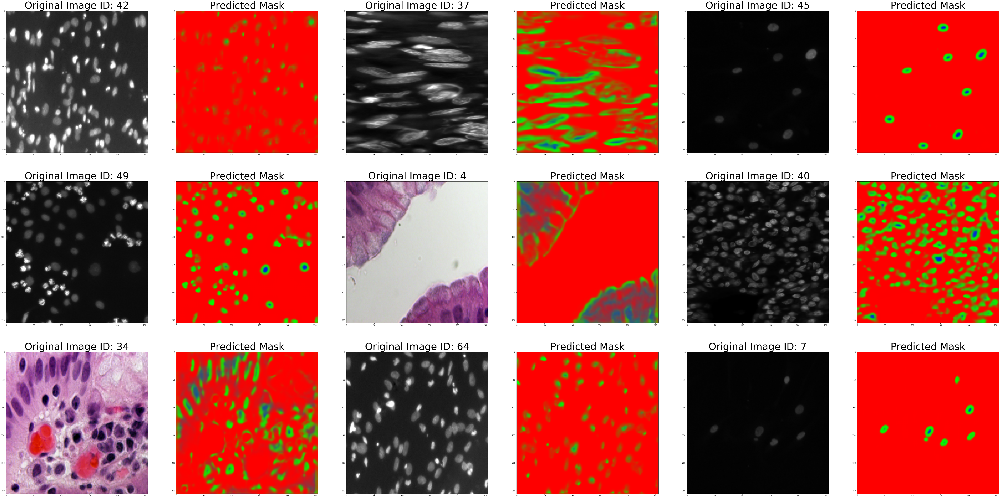

In [103]:
fig = plt.figure(figsize=(100,50))
nSamples = 9
nrows = 3
ncols = 6
ids = np.random.choice(range(X_test.shape[0]), nSamples, replace=False)
counter = 1

for i in ids: 
    #testing image
    plt.subplot(nrows, ncols, counter)
    plt.imshow(X_test[i])
    plt.title('Original Image ' + 'ID: '+str(i), fontsize=55)
    counter += 1
    
    #predicted mask
    plt.subplot(nrows, ncols, counter)
    plt.imshow(preds_test_t[i])
    plt.title('Predicted Mask', fontsize=55)
    counter += 1

51


Text(0.5, 1.0, 'Predicted Mask')

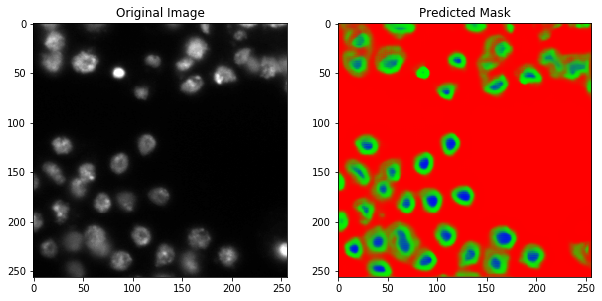

In [104]:
fig = plt.figure(figsize=(10,5))
ix =51 #random.randint(0, len(preds_val_t)) #17 10 32 51
print(ix)

# shows the testing original image
plt.subplot(1, 2, 1)
plt.imshow(X_test[ix])
plt.title('Original Image', fontsize=12)

# shows predicted mask
plt.subplot(1, 2, 2)
plt.imshow(preds_test_t[ix])
plt.title('Predicted Mask', fontsize=12)

# TNBC Dataset

In [269]:
all_ids = next(os.walk('../TNBC_NucleiSegmentation'))[1]
[x.split('_') for x in all_ids]

tnbc_val_x = [x for x in all_ids if 'Slide' in x]
tnbc_val_y = [x for x in all_ids if 'GT' in x]

val_x_paths = []
for x in tnbc_val_x:
    for i in next(os.walk('../TNBC_NucleiSegmentation/'+x))[2]:
        val_x_paths.append('../TNBC_NucleiSegmentation/'+x+'/'+i)

val_y_paths = []
for x in val_x_paths:
    val_y_paths.append(x.replace("Slide","GT"))
    
print(f'val_x_paths length {len(val_x_paths)}')
print(f'val_y_paths length {len(val_y_paths)}')

val_x_paths length 50
val_y_paths length 50


In [270]:
tnbc_x_val = np.zeros((len(val_x_paths), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)

if not os.path.isfile('resizedTNBCXVal256.npy'):
    for n, id_ in tqdm(enumerate(val_x_paths), total=len(val_x_paths)):
        img = imread(id_) #[:,:,:IMG_CHANNELS]
        img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)
        img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
        tnbc_x_val[n] = img
    np.save('resizedTNBCXVal256',tnbc_x_val)

tnbc_x_val = np.load('resizedTNBCXVal256.npy')

print("Shape of tnbc_x_val: "+str(tnbc_x_val.shape))

Shape of tnbc_x_val: (50, 256, 256, 3)


In [283]:
tnbc_y_val = np.zeros((len(val_y_paths), IMG_HEIGHT, IMG_WIDTH,1), dtype=np.uint8)

kernel = np.ones((2,2),np.uint8)

if not os.path.isfile('resizedTNBCYVal256_boundary.npy'):
    for n, id_ in tqdm(enumerate(val_y_paths), total=len(val_y_paths)):
        img = imread(id_) 
        img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
        img = img/255
        erosion = cv2.erode(img, kernel, iterations=2) # Iterations can also help controlling the border size.
        img = img + erosion
        img = img.reshape(IMG_HEIGHT, IMG_WIDTH,1)
        tnbc_y_val[n] = img
    np.save('resizedTNBCYVal256_boundary',tnbc_y_val)

tnbc_y_val = np.load('resizedTNBCYVal256_boundary.npy')

print("Shape of tnbc_y_val: "+str(tnbc_y_val.shape))

Shape of tnbc_y_val: (50, 256, 256, 1)


In [272]:
# Using the Initial Model (not trained on TNBC data)
model = load_model('model-unet-v2.h5', custom_objects={'mean_iou': mean_iou})
tnbc_y_val_pred = model.predict(tnbc_x_val, verbose=1)

50/50 [==============================] - 4s 73ms/step


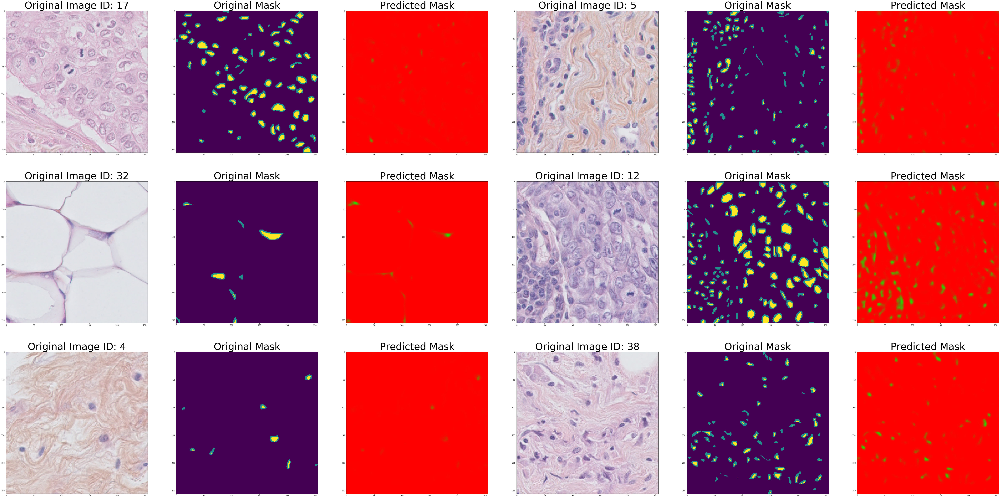

In [273]:
fig = plt.figure(figsize=(100,50))
nSamples = 6
nrows = 3
ncols = 6

ids = np.random.choice(range(tnbc_x_val.shape[0]), nSamples, replace=False)
counter = 1

for i in ids: 
    #original image
    plt.subplot(nrows, ncols, counter)
    plt.imshow(tnbc_x_val[i])
    plt.title('Original Image ' + 'ID: '+str(i), fontsize=55)
    counter += 1
    
    #original mask
    plt.subplot(nrows, ncols, counter)
    plt.imshow(tnbc_y_val[i].reshape(256,256))
    plt.title('Original Mask', fontsize=55)
    counter += 1
    
    #predicted mask
    plt.subplot(nrows, ncols, counter)
    plt.imshow(tnbc_y_val_pred[i])
    plt.title('Predicted Mask', fontsize=55)
    counter += 1

### Augmentations

In [284]:
import albumentations as albu

augments_list = [albu.HorizontalFlip(p=1),
                 albu.VerticalFlip(p=1),
                 albu.RandomRotate90(p=1),
                 albu.ElasticTransform(p=1, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
                 albu.GridDistortion(p=1),
                 albu.OpticalDistortion(p=1, distort_limit=2, shift_limit=0.5)
                ]

In [285]:
tnbc_x_val_aug = np.zeros((7*len(val_x_paths), IMG_HEIGHT, IMG_WIDTH,3), dtype=np.uint8)
tnbc_y_val_aug = np.zeros((7*len(val_y_paths), IMG_HEIGHT, IMG_WIDTH,1), dtype=np.uint8)

# Adding Augmentation

i = 0
for (img,mask) in zip(tnbc_x_val,tnbc_y_val):
    for augment in augments_list:
        augmented = augment(image=img, mask=mask)
        image_auged = augmented['image']
        mask_auged = augmented['mask']
        tnbc_x_val_aug[i,:,:,:] = image_auged
        tnbc_y_val_aug[i,:,:,:] = mask_auged
        i= i+1

# Adding Originals
for i in range(300,350):
    tnbc_x_val_aug[i,:,:,:] = tnbc_x_val[i-300]
    tnbc_y_val_aug[i,:,:,:] = tnbc_y_val[i-300]

print(tnbc_x_val_aug.shape,tnbc_y_val_aug.shape)

(350, 256, 256, 3) (350, 256, 256, 1)


In [301]:
tnbc_y_val_aug[j].shape

(256, 256, 3)

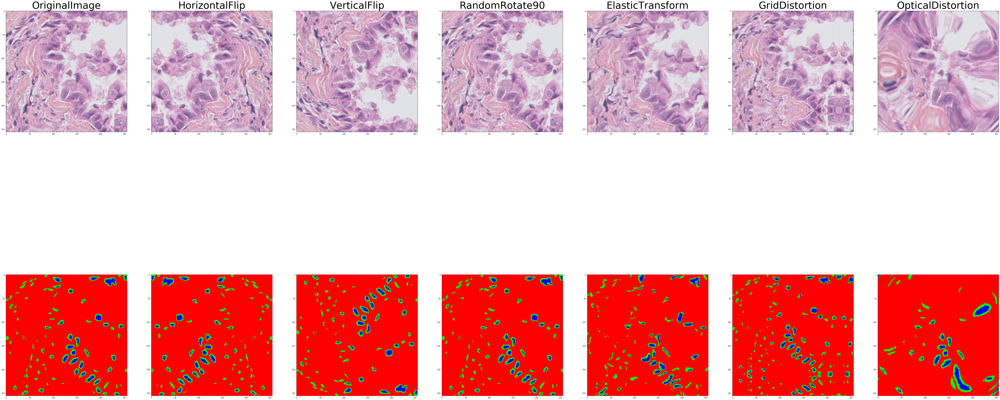

In [303]:
fig = plt.figure(figsize=(100,50))
nrows = 2
ncols = 7
ids = np.array([300,0,1,2,3,4,5])
titles = ['OriginalImage','HorizontalFlip','VerticalFlip','RandomRotate90','ElasticTransform',
          'GridDistortion','OpticalDistortion']

for i,j in enumerate(ids):
    #original image
    plt.subplot(nrows, ncols, i+1)
    plt.imshow(tnbc_x_val_aug[j])
    plt.title(titles[i], fontsize=55)

    #original image
    plt.subplot(nrows, ncols, i+8)
    plt.imshow(tnbc_y_val_aug[j])

In [287]:
print(tnbc_y_val_aug.shape)

(350, 256, 256, 1)


#### One-Hot Encoding

In [288]:
all_full_masks = tnbc_y_val_aug.reshape(tnbc_y_val_aug.shape[0],tnbc_y_val.shape[1],tnbc_y_val.shape[2])
all_one_hot_mask = list()

for i in tqdm(range(all_full_masks.shape[0])):
    one_hot_mask = np.zeros((all_full_masks[i].shape[0], all_full_masks[i].shape[1], 3))  # 3 = nb of classes

    np.put_along_axis(
        one_hot_mask,
        indices=all_full_masks[i][..., np.newaxis].astype(np.int32),
        values=all_full_masks[i][..., np.newaxis] > -1,
        axis=-1,
    )
    
    all_one_hot_mask.append(one_hot_mask)

all_one_hot_mask = np.array(all_one_hot_mask)

tnbc_y_val_aug = all_one_hot_mask
print("Shape of tnbc_y_val_aug: "+str(tnbc_y_val_aug.shape))


Shape of tnbc_y_val_aug: (350, 256, 256, 3)


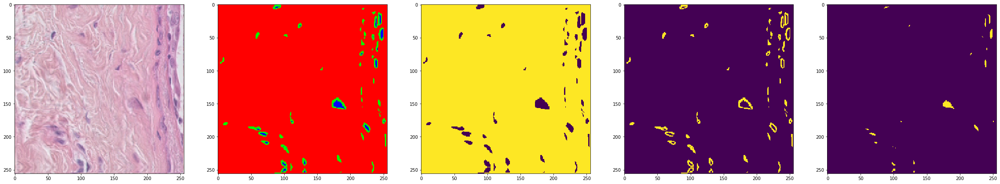

In [289]:
fig = plt.figure(figsize=(40,10))
ex = 10

# original image
plt.subplot(1,5,1)
plt.imshow(tnbc_x_val_aug[ex])

# with all 3 classes
plt.subplot(1,5,2)
plt.imshow(tnbc_y_val_aug[ex])

# background
plt.subplot(1,5,3)
plt.imshow(tnbc_y_val_aug[ex][...,0])

# borders
plt.subplot(1,5,4)
plt.imshow(tnbc_y_val_aug[ex][...,1])

# cells
plt.subplot(1,5,5)
plt.imshow(tnbc_y_val_aug[ex][...,2])

### Train Model On TNBC Dataset

#### Create Train and Val Data

In [290]:
nImages = tnbc_x_val_aug.shape[0]
valImages = int(0.2*nImages)
print(f'Images in Train {nImages-valImages} and Images in Val {valImages}','\n')

train_idx = list(np.concatenate((np.arange(240) ,np.arange(300,340))))
val_idx = list(np.concatenate((np.arange(240,300) ,np.arange(340,350))))

X_train, X_val = tnbc_x_val_aug[train_idx,:,:,:,], tnbc_x_val_aug[val_idx,:,:,:,]
Y_train, Y_val = tnbc_y_val_aug[train_idx,:,:,:,], tnbc_y_val_aug[val_idx,:,:,:,]

print(f'X_train {X_train.shape} | Y_train {Y_train.shape}')
print(f'X_val   {X_val.shape} | Y_val   {Y_val.shape}')

Images in Train 280 and Images in Val 70 

X_train (280, 256, 256, 3) | Y_train (280, 256, 256, 3)
X_val   (70, 256, 256, 3) | Y_val   (70, 256, 256, 3)


In [291]:
model_tnbc = Model(inputs=[inputs], outputs=[outputs])
model_tnbc.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[mean_iou,'categorical_accuracy'])
model_tnbc.summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
lambda_3 (Lambda)               (None, 256, 256, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_39 (Conv2D)              (None, 256, 256, 16) 448         lambda_3[0][0]                   
__________________________________________________________________________________________________
dropout_19 (Dropout)            (None, 256, 256, 16) 0           conv2d_39[0][0]                  
____________________________________________________________________________________________

In [293]:
earlystopper = EarlyStopping(patience=5, verbose=1)
checkpointer = ModelCheckpoint('model-unet-tnbc-v2.h5', verbose=1, save_best_only=True) # v1 is also partially working
results = model_tnbc.fit(X_train, Y_train, validation_split=0.1, batch_size=4, epochs=50, 
                    callbacks=[earlystopper, checkpointer])

Train on 252 samples, validate on 28 samples
Epoch 1/50
252/252 [==============================] - 74s 293ms/step - loss: 0.3133 - mean_iou: 0.7421 - categorical_accuracy: 0.9067 - val_loss: 0.3175 - val_mean_iou: 0.7900 - val_categorical_accuracy: 0.9019

Epoch 00001: val_loss improved from inf to 0.31751, saving model to model-unet-tnbc-v2.h5
Epoch 2/50
252/252 [==============================] - 69s 275ms/step - loss: 0.2708 - mean_iou: 0.8049 - categorical_accuracy: 0.9068 - val_loss: 0.2631 - val_mean_iou: 0.8128 - val_categorical_accuracy: 0.9022

Epoch 00002: val_loss improved from 0.31751 to 0.26308, saving model to model-unet-tnbc-v2.h5
Epoch 3/50
252/252 [==============================] - 71s 282ms/step - loss: 0.2476 - mean_iou: 0.8194 - categorical_accuracy: 0.9098 - val_loss: 0.2515 - val_mean_iou: 0.8238 - val_categorical_accuracy: 0.9141

Epoch 00003: val_loss improved from 0.26308 to 0.25154, saving model to model-unet-tnbc-v2.h5
Epoch 4/50
252/252 [=====================

Epoch 29/50
252/252 [==============================] - 66s 261ms/step - loss: 0.1494 - mean_iou: 0.8736 - categorical_accuracy: 0.9381 - val_loss: 0.1306 - val_mean_iou: 0.8740 - val_categorical_accuracy: 0.9466

Epoch 00029: val_loss did not improve from 0.12860
Epoch 30/50
252/252 [==============================] - 67s 267ms/step - loss: 0.1469 - mean_iou: 0.8744 - categorical_accuracy: 0.9385 - val_loss: 0.1309 - val_mean_iou: 0.8747 - val_categorical_accuracy: 0.9463

Epoch 00030: val_loss did not improve from 0.12860
Epoch 31/50
252/252 [==============================] - 66s 262ms/step - loss: 0.1458 - mean_iou: 0.8750 - categorical_accuracy: 0.9391 - val_loss: 0.1281 - val_mean_iou: 0.8754 - val_categorical_accuracy: 0.9478

Epoch 00031: val_loss improved from 0.12860 to 0.12812, saving model to model-unet-tnbc-v2.h5
Epoch 32/50
252/252 [==============================] - 66s 261ms/step - loss: 0.1440 - mean_iou: 0.8758 - categorical_accuracy: 0.9398 - val_loss: 0.1256 - val_mean_

#### Predicting on Train Dataset

In [294]:
Y_train_pred = model_tnbc.predict(X_train, verbose=1)

280/280 [==============================] - 13s 48ms/step


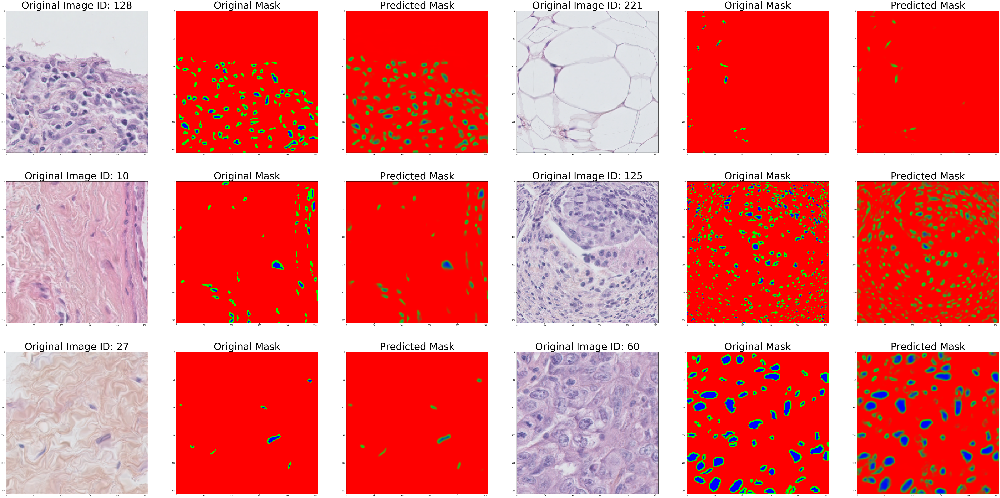

In [295]:
fig = plt.figure(figsize=(100,50))
nSamples = 6
nrows = 3
ncols = 6

ids = np.random.choice(range(X_train.shape[0]), nSamples, replace=False)
counter = 1

for i in ids: 
    #original image
    plt.subplot(nrows, ncols, counter)
    plt.imshow(X_train[i])
    plt.title('Original Image ' + 'ID: '+str(i), fontsize=55)
    counter += 1
    
    #original mask
    plt.subplot(nrows, ncols, counter)
    plt.imshow(Y_train[i])
    plt.title('Original Mask', fontsize=55)
    counter += 1
    
    #predicted mask
    plt.subplot(nrows, ncols, counter)
    plt.imshow(Y_train_pred[i])
    plt.title('Predicted Mask', fontsize=55)
    counter += 1

#### Predicting on Validation Dataset (not exposed to training)

70/70 [==============================] - 3s 44ms/step


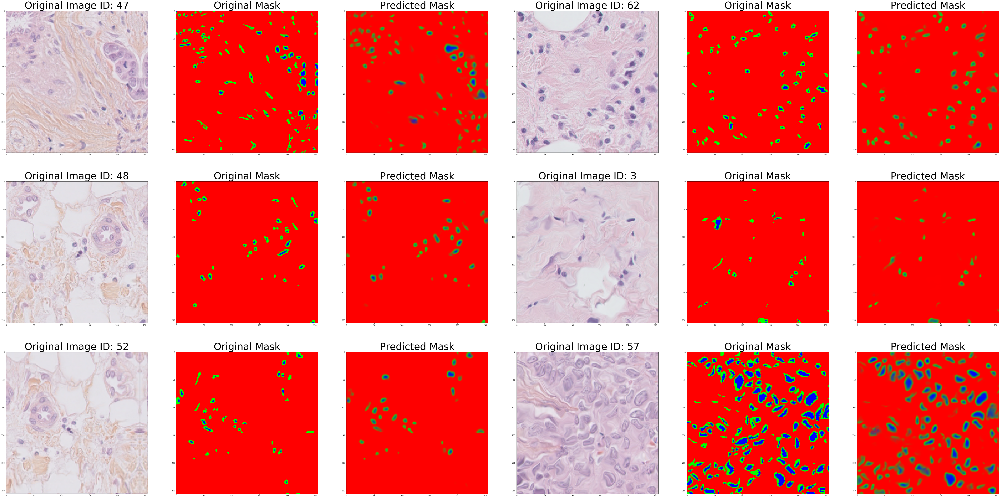

In [296]:
Y_val_pred = model_tnbc.predict(X_val, verbose=1)

fig = plt.figure(figsize=(100,50))
nSamples = 6
nrows = 3
ncols = 6

ids = np.random.choice(range(X_val.shape[0]), nSamples, replace=False)
counter = 1

for i in ids: 
    #original image
    plt.subplot(nrows, ncols, counter)
    plt.imshow(X_val[i])
    plt.title('Original Image ' + 'ID: '+str(i), fontsize=55)
    counter += 1
    
    #original mask
    plt.subplot(nrows, ncols, counter)
    plt.imshow(Y_val[i])
    plt.title('Original Mask', fontsize=55)
    counter += 1
    
    #predicted mask
    plt.subplot(nrows, ncols, counter)
    plt.imshow(Y_val_pred[i])
    plt.title('Predicted Mask', fontsize=55)
    counter += 1

### Model Summary

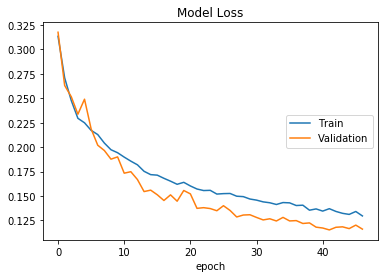

In [297]:
# summarize history for loss
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='center right')
plt.show()


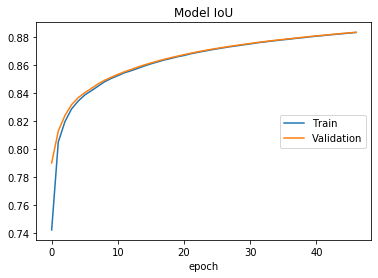

In [298]:
# summarize history for accuracy
plt.plot(results.history['mean_iou'])
plt.plot(results.history['val_mean_iou'])
plt.title('Model IoU')
plt.xlabel('epoch')
plt.legend(['Train', 'Validation'], loc='center right')
plt.show()